In [1]:
%reload_ext autoreload
%autoreload 2
%matplotlib inline

In [2]:
import warnings
warnings.filterwarnings("ignore", category=UserWarning)

In [3]:
import numpy as np
from tqdm import tqdm
from pathlib import Path
import openslide
import pandas as pd

In [4]:
from fastai.callbacks.csv_logger import CSVLogger

In [5]:
from object_detection_fastai.helper.object_detection_helper import *
from object_detection_fastai.helper.wsi_loader import *
from object_detection_fastai.loss.RetinaNetFocalLoss import RetinaNetFocalLoss
from object_detection_fastai.models.RetinaNet import RetinaNet
from object_detection_fastai.callbacks.callbacks import BBLossMetrics, BBMetrics, PascalVOCMetric, PascalVOCMetricByDistance

In [6]:
slides_train = list(set(['BAL Promyk Spray 4.svs',
                         'BAL AIA Blickfang Luft.svs']))

slides_val = list(set(['BAL 1 Spray 2.svs', 
                         'BAL Booker Spray 3.svs',
                         'BAL Bubi Spray 1.svs', 
                         'BAL cent blue Luft 2.svs']))

labels = ['Mastzellen']

In [7]:
experiment_name = "Asthma-L0"

In [8]:
annotations_path = Path("../Statistics/Asthma_Annotations.pkl")
annotations = pd.read_pickle(annotations_path)

annotations = annotations[annotations["class"].isin(labels)]
annotations_train = annotations[annotations["image_name"].isin(slides_train)]
annotations_val = annotations[annotations["image_name"].isin(slides_val)]
annotations_train.head()

,id,image_id,image_name,image_set,class,vector,unique_identifier,user_id,deleted,last_editor
43186,140927,226,BAL Promyk Spray 4.svs,14,Mastzellen,"{'x1': 14741, 'x2': 14827, 'y1': 14194, 'y2': ...",fa37f7fc-bcab-4844-bfc7-8cb6ba7fe506,10,False,None
43187,141001,226,BAL Promyk Spray 4.svs,14,Mastzellen,"{'x1': 10914, 'x2': 11004, 'y1': 14515, 'y2': ...",db42c6ef-68a7-45cb-a3c0-87211ab57e22,10,False,None
43188,141053,226,BAL Promyk Spray 4.svs,14,Mastzellen,"{'x1': 8370, 'x2': 8448, 'y1': 14688, 'y2': 14...",cc8c5b57-06d3-4cea-a685-9805cc4ee042,10,False,None
43189,141079,226,BAL Promyk Spray 4.svs,14,Mastzellen,"{'x1': 6881, 'x2': 6957, 'y1': 15092, 'y2': 15...",050dbd77-06b6-4c80-9b9a-d49c07d18232,10,False,None
43190,141205,226,BAL Promyk Spray 4.svs,14,Mastzellen,"{'x1': 4730, 'x2': 4822, 'y1': 15420, 'y2': 15...",652da145-ef27-4965-8e46-20e53d855a7e,10,False,None


In [9]:
annotations["width"] = [vector["x2"] - vector["x1"] for vector in annotations["vector"]]
annotations["height"] = [vector["y2"] - vector["y1"] for vector in annotations["vector"]]
annotations["scale"] = annotations["width"] / annotations["height"]

<AxesSubplot:xlabel='width', ylabel='height'>

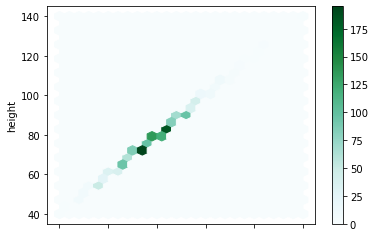

In [10]:
annotations.plot.hexbin(x='width', y='height', gridsize=25) #C='scale', 

In [11]:
slides_path = Path("../Slides")
files = {slide.name: slide for slide in slides_path.rglob("*.svs") if slide.name in slides_train + slides_val}
files

{'BAL 1 Spray 2.svs': WindowsPath('../Slides/BAL 1 Spray 2.svs'),
 'BAL AIA Blickfang Luft.svs': WindowsPath('../Slides/BAL AIA Blickfang Luft.svs'),
 'BAL Booker Spray 3.svs': WindowsPath('../Slides/BAL Booker Spray 3.svs'),
 'BAL Bubi Spray 1.svs': WindowsPath('../Slides/BAL Bubi Spray 1.svs'),
 'BAL cent blue Luft 2.svs': WindowsPath('../Slides/BAL cent blue Luft 2.svs'),
 'BAL Promyk Spray 4.svs': WindowsPath('../Slides/BAL Promyk Spray 4.svs')}

In [12]:
size = 1024 
level = 0
bs = 16
train_images = 500
val_images = 500

In [13]:
train_files = []
val_files = []

In [14]:
for image_name in annotations_train["image_name"].unique():
    
    annotations = annotations_train[annotations_train["image_name"] == image_name]
    annotations = annotations[annotations["deleted"] == False]
    
    slide_path = files[image_name]
    labels =  list(annotations["class"])
    bboxes = [[vector["x1"], vector["y1"], vector["x2"], vector["y2"]] for vector in annotations["vector"]]
    
    for label in labels:
        if label not in set(labels):
            bboxes.append([0,0,0,0])
            labels.append(label)

    train_files.append(SlideContainer(slide_path, y=[bboxes, labels],  level=level, width=size, height=size))
    
for image_name in annotations_val["image_name"].unique():
    
    annotations = annotations_val[annotations_val["image_name"] == image_name]
    annotations = annotations[annotations["deleted"] == False]
    
    slide_path = files[image_name]
    labels =  list(annotations["class"])
    bboxes = [[vector["x1"], vector["y1"], vector["x2"], vector["y2"]] for vector in annotations["vector"]]
    
    for label in labels:
        if label not in set(labels):
            bboxes.append([0,0,0,0])
            labels.append(label)

    val_files.append(SlideContainer(slide_path, y=[bboxes, labels],  level=level, width=size, height=size))

train_files = list(np.random.choice(train_files, train_images))
valid_files = list(np.random.choice(val_files, val_images))

In [15]:
tfms = get_transforms(do_flip=True,
                      flip_vert=True,
                      #max_rotate=90,
                      #max_lighting=0.0,
                      #max_zoom=1.,
                      #max_warp=0.0,
                      #p_affine=0.5,
                      #p_lighting=0.0,
                      #xtra_tfms=xtra_tfms,
                     )

In [16]:
def get_y_func(x):
    return x.y

In [17]:
train =  ObjectItemListSlide(train_files, path=slides_path)
valid = ObjectItemListSlide(valid_files, path=slides_path)
item_list = ItemLists(slides_path, train, valid)
lls = item_list.label_from_func(get_y_func, label_cls=SlideObjectCategoryList) #
lls = lls.transform(tfms, tfm_y=True, size=size)
data = lls.databunch(bs=bs, collate_fn=bb_pad_collate, num_workers=0).normalize()

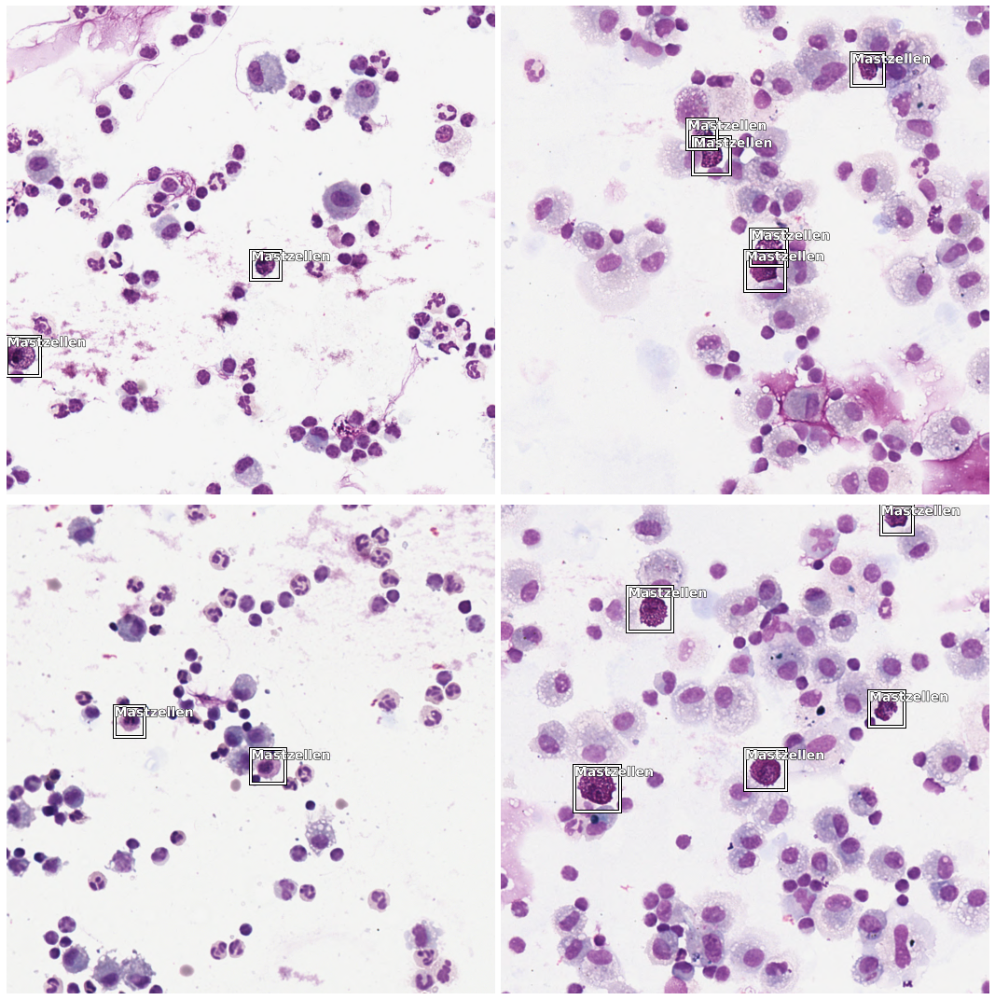

In [18]:
data.show_batch(rows=2, ds_type=DatasetType.Valid, figsize=(15,15))

In [19]:
scales = [.8, .9, 1, 1.1]
anchors = create_anchors(sizes=[(64, 64), (32,32)], ratios=[1], scales=scales)

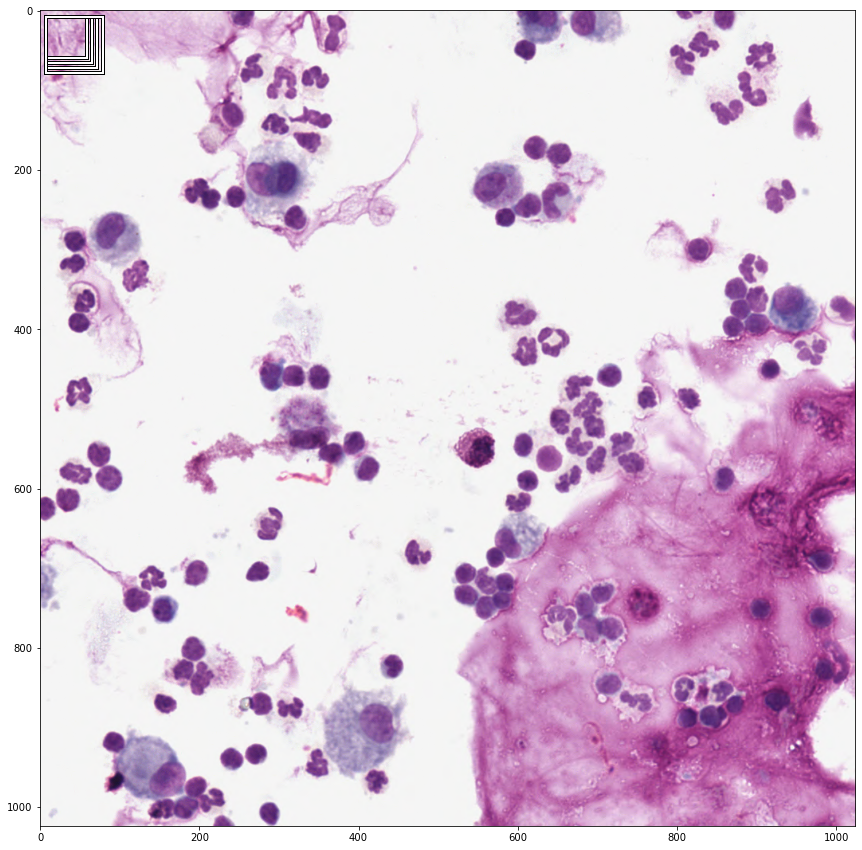

In [20]:
fig,ax = plt.subplots(figsize=(15,15))
ax.imshow(image2np(data.valid_ds[0][0].data))

for i, bbox in enumerate(anchors[:len(scales)]):
    bb = bbox.numpy()
    x = (bb[0] + 1) * size / 2 
    y = (bb[1] + 1) * size / 2 
    w = bb[2] * size / 2
    h = bb[3] * size / 2
    
    rect = [x,y,w,h]
    draw_rect(ax,rect)

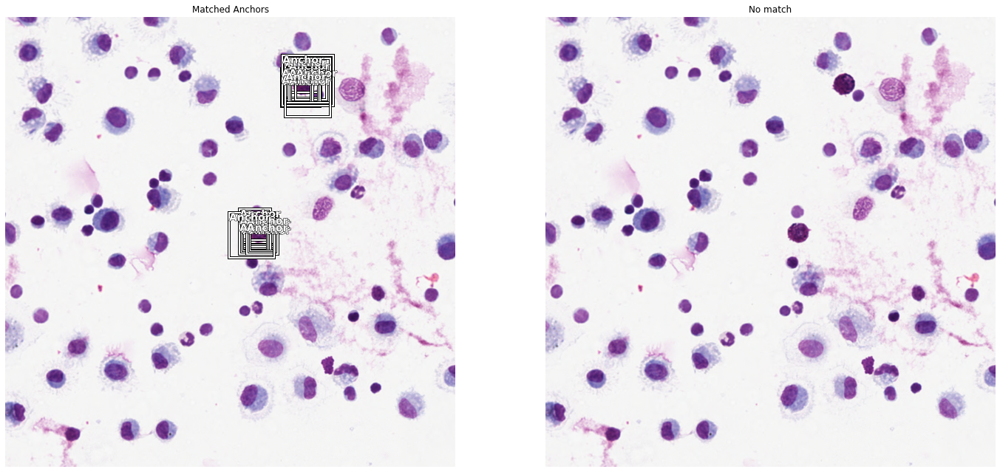

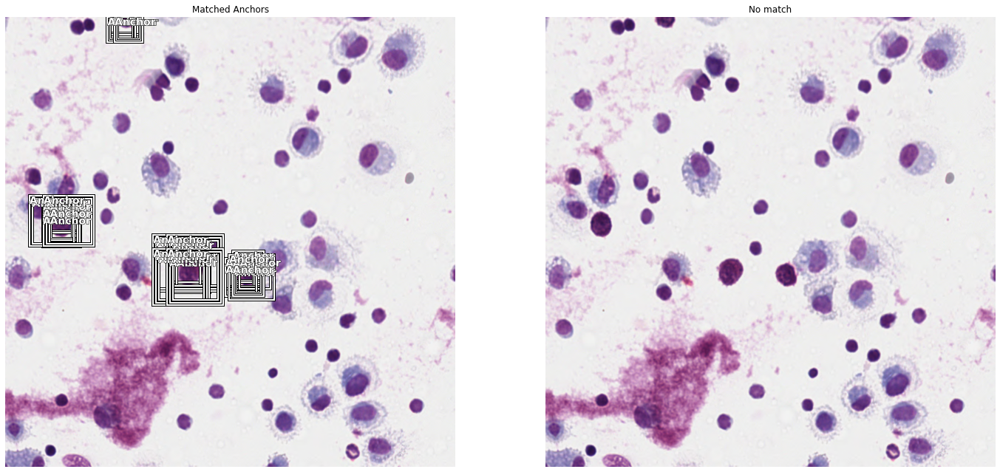

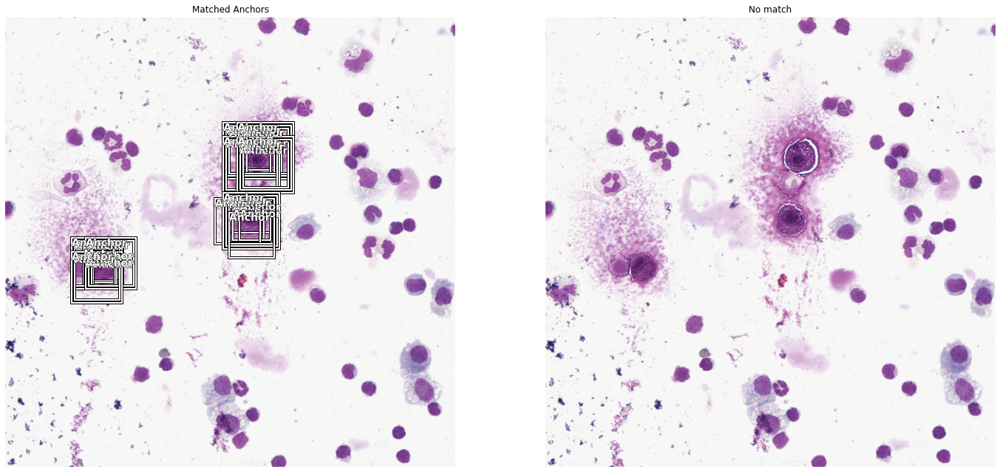

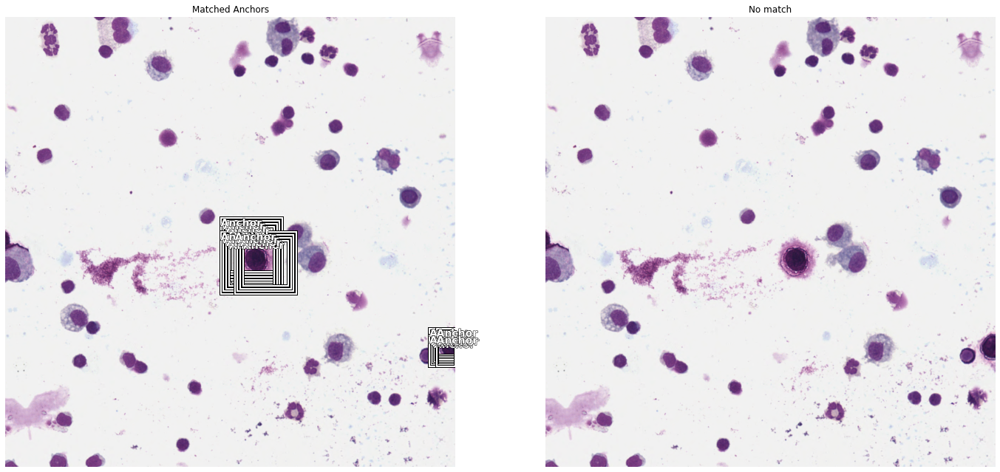

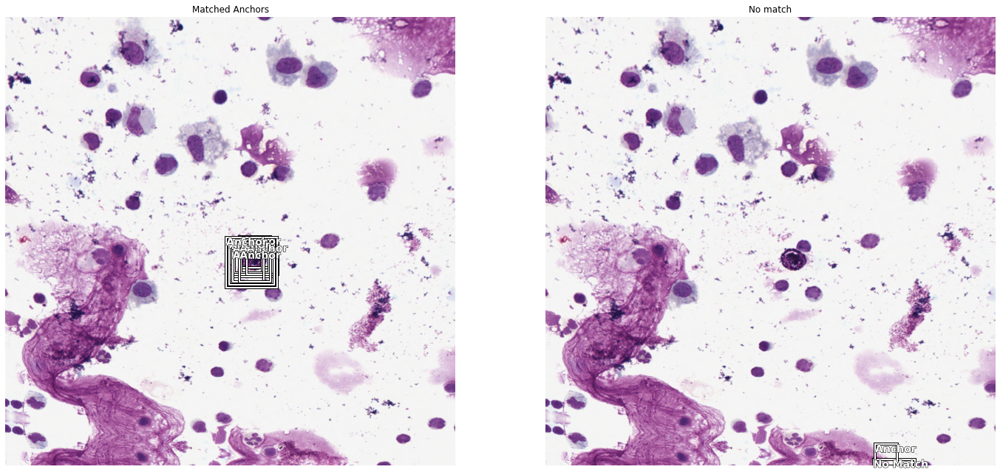

...

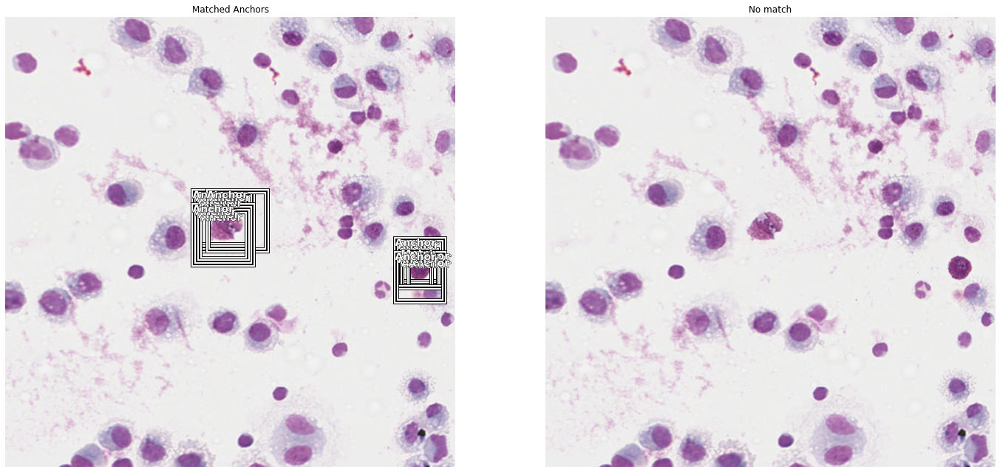

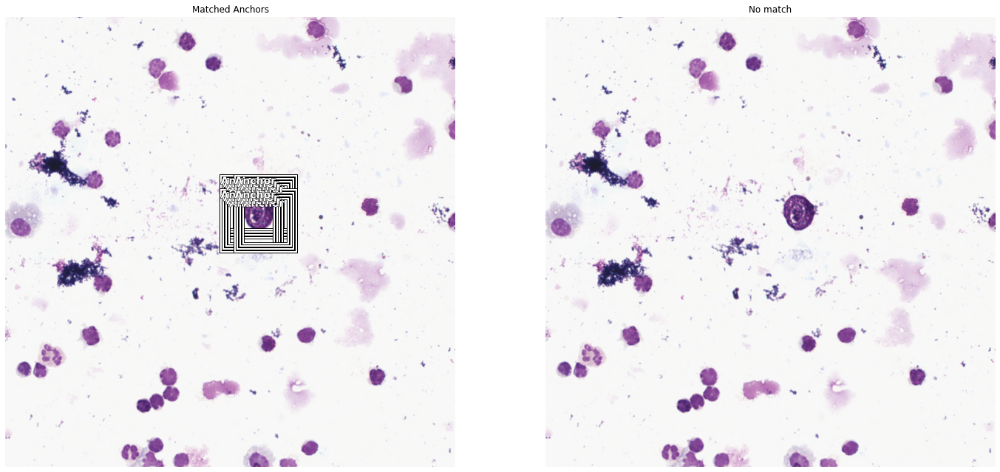

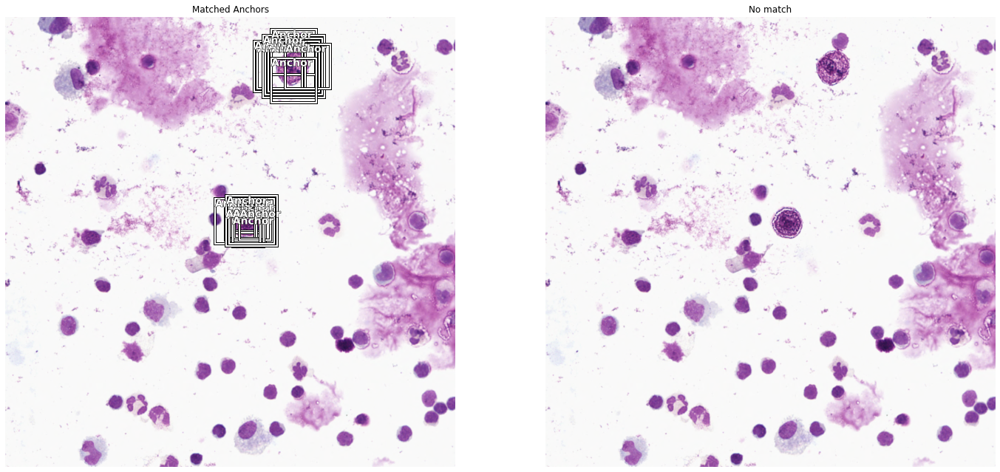

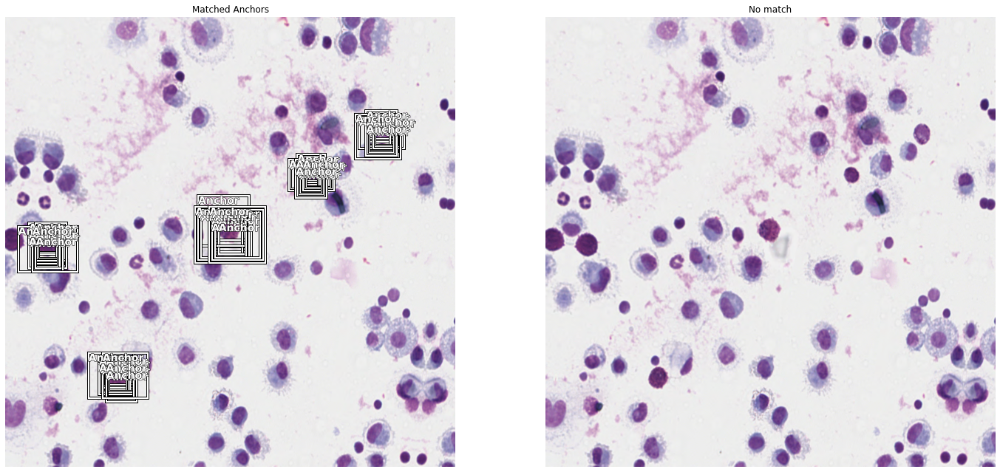

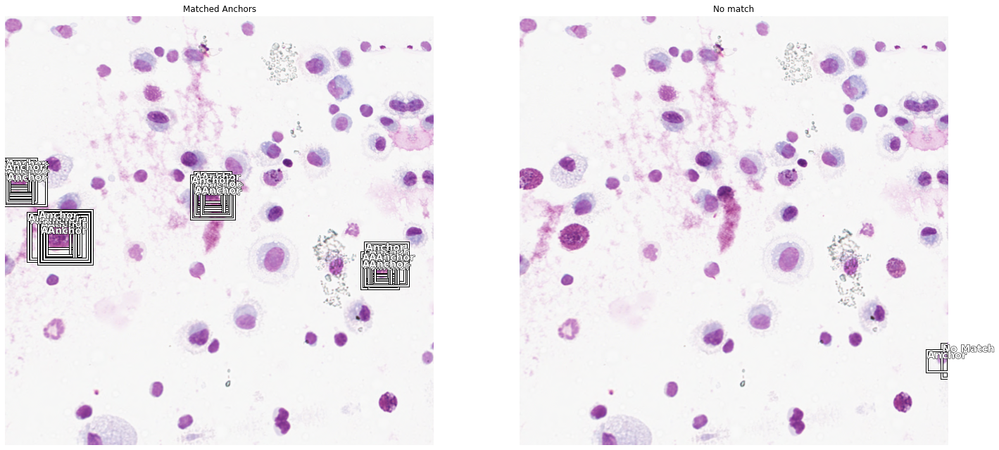

In [21]:
all_boxes, all_labels = show_anchors_on_images(data, anchors, figsize=(24, 24))

In [22]:
crit = RetinaNetFocalLoss(anchors)

encoder = create_body(models.resnet18, True, -2)
model = RetinaNet(encoder, n_classes=data.train_ds.c, n_anchors=len(scales), sizes=[64, 32], chs=128, final_bias=-4., n_conv=2)

In [23]:
voc = PascalVOCMetricByDistance(anchors, size, [str(i) for i in data.train_ds.y.classes[1:]], radius=40)
learn = Learner(data, model, loss_func=crit, callback_fns=[BBMetrics], #BBMetrics, ShowGraph
                metrics=[voc])

In [24]:
learn.split([model.encoder[6], model.c5top5])
learn.freeze_to(-2)

In [25]:
learn.fit_one_cycle(3, 1e-3)

epoch,train_loss,valid_loss,pascal_voc_metric_by_distance,BBloss,focal_loss,AP-Mastzellen,time
0,1.227621,0.811909,0.582385,0.262842,0.549067,0.582385,04:49
1,0.681570,0.533547,0.687798,0.144390,0.389157,0.687798,04:43
2,0.459874,0.515891,0.706192,0.145862,0.370028,0.706192,04:53


In [26]:
learn.unfreeze()
learn.fit_one_cycle(10, 1e-3)

epoch,train_loss,valid_loss,pascal_voc_metric_by_distance,BBloss,focal_loss,AP-Mastzellen,time
0,0.277986,0.615548,0.656876,0.153748,0.461800,0.656876,04:53
1,0.338886,0.618299,0.643562,0.180429,0.437869,0.643562,04:51
2,0.397490,0.589778,0.717203,0.151839,0.437939,0.717203,08:02
3,0.350291,0.527927,0.732088,0.148471,0.379456,0.732088,11:36
4,0.332678,0.453500,0.735305,0.117008,0.336492,0.735305,11:47
5,0.297179,0.707685,0.718189,0.109583,0.598102,0.718189,04:54
6,0.257975,0.577694,0.712949,0.099156,0.478538,0.712949,05:02
7,0.228328,0.480285,0.745119,0.105938,0.374348,0.745119,06:28
8,0.211240,0.371530,0.755584,0.099860,0.271669,0.755584,06:05
9,0.190658,0.394112,0.727817,0.098998,0.295114,0.727817,10:02


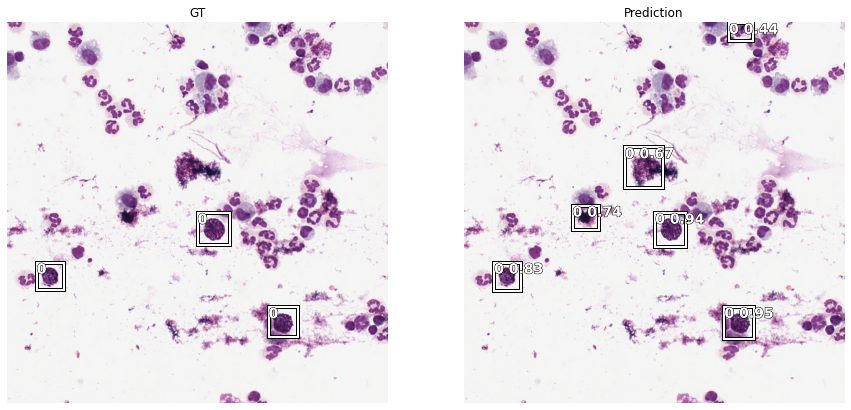

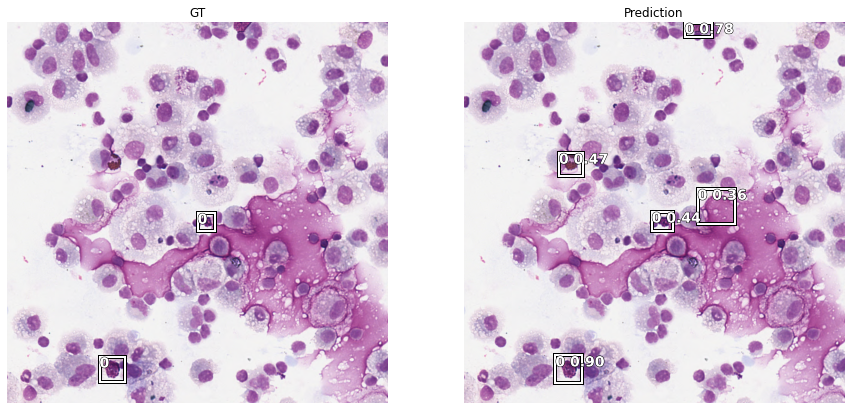

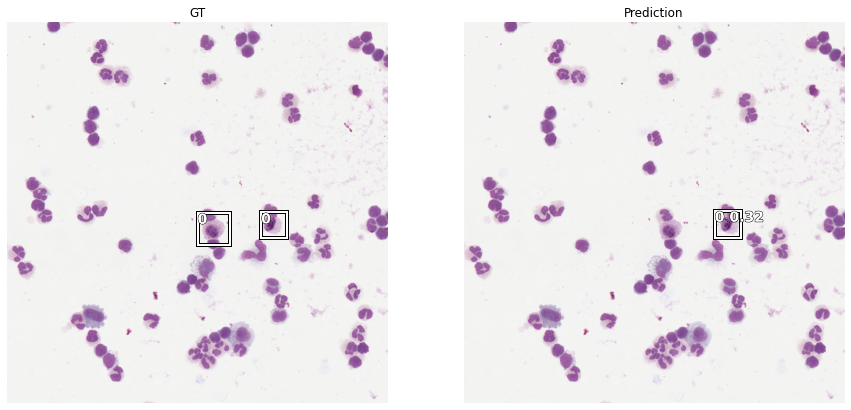

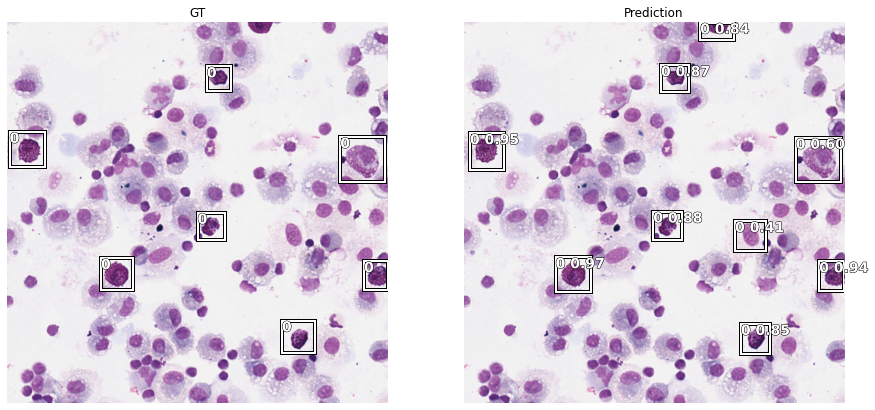

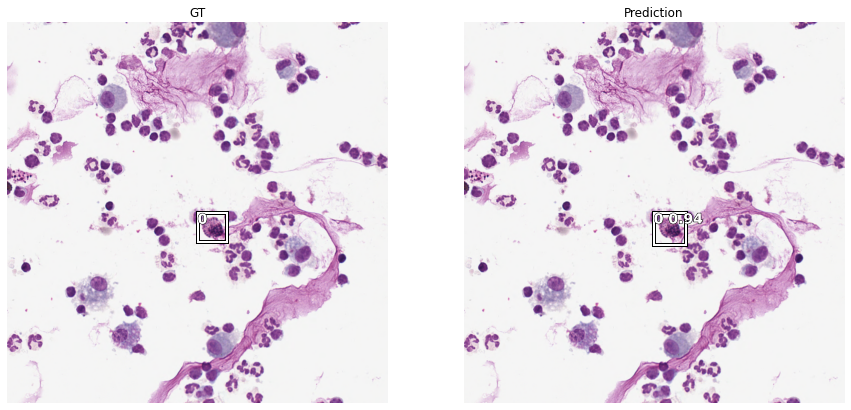

In [27]:
slide_object_result(learn, anchors, detect_thresh=0.3, nms_thresh=0.2)